In [1]:
%pip install pandas networkx scipy loguru sklearn autograd openpyxl

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import os 
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from copy import deepcopy
from scipy.spatial.distance import pdist
import itertools as it 
os.chdir('..')
from src.data_cleaning import *
from src.autograd_mds import *
from autograd import grad, elementwise_grad 
from loguru import logger
import sys

from matplotlib.collections import LineCollection

from sklearn import manifold
from sklearn.metrics import euclidean_distances
from sklearn.decomposition import PCA
from sklearn.utils import check_random_state
from sklearn.manifold import MDS
# Unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401
import warnings


In [3]:
os.listdir()


['.git',
 '.gitignore',
 'config',
 'data',
 'doc',
 'Dockerfile',
 'notebook',
 'pyproject.toml',
 'README.md',
 'src',
 'test']

In [4]:
url = 'http://cs.bc.edu/~prudhome/AAPLD/animal-similarity.csv'

raw_dataset = pd.read_csv(url, index_col=0)
list_of_animal_pairs = raw_dataset.index.str.split('~')

In [5]:
dissimilarity_weights = [np.exp(-1*x) for x in raw_dataset['Average_Rating']]


In [6]:
weighted_list_of_animal_pairs = [x+ [dissimilarity_weights[_]] for _, x in enumerate(list_of_animal_pairs)]

In [7]:
animal_pair_data = pd.DataFrame.from_records(list_of_animal_pairs, columns=['first_animal', 'second_animal'], index= raw_dataset.index)

In [8]:
animal_pair_data.sort_values(by = ['first_animal', 'second_animal'], inplace=True)

In [9]:
unique_animals = set(animal_pair_data.first_animal).union(animal_pair_data.second_animal)

In [10]:
animal_pairs = nx.Graph()
animal_pairs.add_nodes_from(unique_animals)
animal_pairs.add_weighted_edges_from(weighted_list_of_animal_pairs)

In [11]:
low_degree=[k for k,v in animal_pairs.degree._nodes.items() if len(v) < 32]

In [12]:
animal_pairs.remove_nodes_from(low_degree)

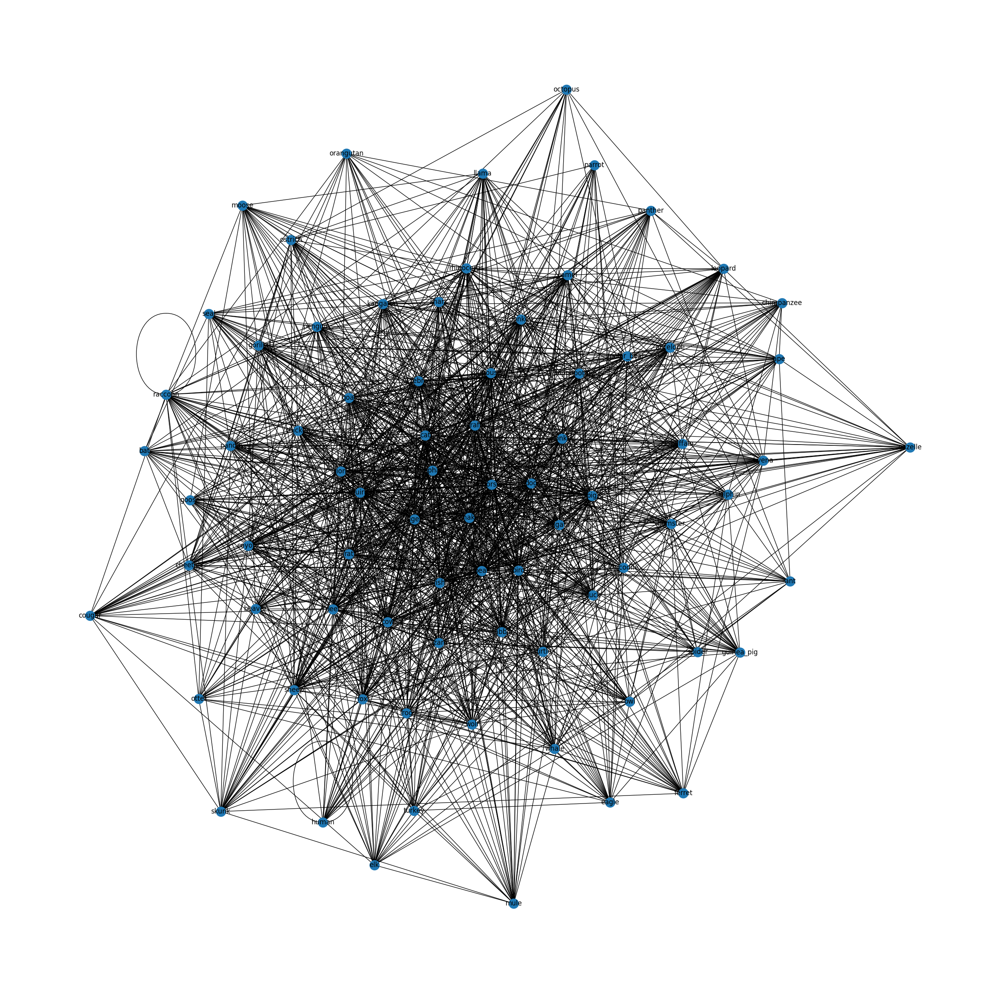

In [13]:
fig, ax = plt.subplots(figsize=(32,32))
nx.draw(animal_pairs, with_labels=True, ax=ax)

plt.show()

In [14]:
connected_list = [x for x in animal_pairs.nodes]

In [15]:
# try the small list, or, failing that, just the apes

In [16]:
smaller_animal_pair_data=animal_pair_data.loc[animal_pair_data['first_animal' ].isin( connected_list) & animal_pair_data['second_animal' ].isin( connected_list) ] 

In [17]:
joined_data=smaller_animal_pair_data.join(raw_dataset).drop(columns='[All_Ratings]')

In [18]:
big_matrix = pd.DataFrame(index=connected_list, columns = connected_list)

In [19]:
joined_data

,first_animal,second_animal,Average_Rating
Pair,,,
alligator~antelope,alligator,antelope,1.940
alligator~bird,alligator,bird,2.080
alligator~buffalo,alligator,buffalo,1.080
alligator~elephant,alligator,elephant,1.140
alligator~fish,alligator,fish,1.000
...,...,...,...
zebra~seal,zebra,seal,1.040
zebra~shark,zebra,shark,1.067
zebra~snake,zebra,snake,1.880


In [20]:
#TODO wrap below section into functions

In [21]:
for row in joined_data.iterrows():
    big_matrix.loc[row[1].first_animal][row[1].second_animal] = row[1].Average_Rating
    big_matrix.loc[row[1].second_animal][row[1].first_animal] = row[1].Average_Rating

In [22]:
big_matrix = big_matrix.astype(float)

In [23]:
# big_matrix = big_matrix[big_matrix.isna().mean(1) < 0.5]
# big_matrix = big_matrix[big_matrix.index.to_list()]

In [24]:
big_matrix = big_matrix[big_matrix.isna().mean(1) < 0.33]

In [25]:
big_matrix = big_matrix[big_matrix.index.to_list()]

In [26]:
plt.matshow(big_matrix)

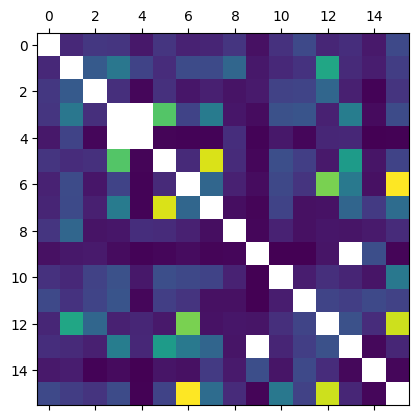

In [27]:
plt.show()

In [28]:
big_matrix.isna().mean(1)

elephant    0.0625
dog         0.0625
pig         0.0625
deer        0.1250
bird        0.1250
horse       0.0625
tiger       0.0625
zebra       0.0625
monkey      0.0625
fish        0.1250
giraffe     0.0625
bear        0.0625
cat         0.0625
cow         0.1250
snake       0.0625
lion        0.0625
dtype: float64

In [29]:
big_matrix.shape

(16, 16)

In [30]:
big_matrix

,elephant,dog,pig,deer,bird,horse,tiger,zebra,monkey,fish,giraffe,bear,cat,cow,snake,lion
elephant,NaN,1.600,1.840,1.80,1.34,1.800,1.500,1.550,1.81,1.240,1.740,2.160,1.560,1.683,1.36,2.160
dog,1.600,NaN,2.480,3.06,2.05,1.660,2.200,2.175,2.72,1.340,1.600,1.760,4.080,1.620,1.42,1.940
pig,1.840,2.480,NaN,1.70,1.10,1.720,1.320,1.460,1.28,1.370,2.020,2.080,2.717,1.460,1.06,1.780
deer,1.800,3.060,1.700,NaN,NaN,4.820,2.040,3.180,1.32,1.180,2.300,2.360,1.480,3.220,1.16,2.200
bird,1.340,2.050,1.100,NaN,NaN,1.080,1.060,1.060,1.68,1.060,1.340,1.100,1.560,1.580,1.00,1.040
horse,1.800,1.660,1.720,4.82,1.08,NaN,1.620,5.917,1.64,1.100,2.250,1.960,1.360,3.860,1.30,2.040
tiger,1.500,2.200,1.320,2.04,1.06,1.620,NaN,2.720,1.48,1.180,2.125,1.780,5.160,3.117,1.24,6.220
zebra,1.550,2.175,1.460,3.18,1.06,5.917,2.720,NaN,1.20,1.080,2.040,1.240,1.260,2.700,1.88,2.840
monkey,1.810,2.720,1.280,1.32,1.68,1.640,1.480,1.200,NaN,1.100,1.500,1.240,1.320,1.290,1.38,1.640
fish,1.240,1.340,1.370,1.18,1.06,1.100,1.180,1.080,1.10,NaN,1.020,1.000,1.300,NaN,2.26,1.067


In [31]:
# todo make into function
similarities = big_matrix.to_numpy()
similarity_vec = np.tril(similarities, -1)
similarity_vec = similarity_vec[np.nonzero(similarity_vec)]

In [32]:
# FIll in NA's 

In [33]:
similarity_vec = np.nan_to_num(similarity_vec, nan=min(similarity_vec))

In [34]:
dissimilarity_vec = np.exp(-1*similarity_vec)
dissimilarity_vec/=np.linalg.norm(dissimilarity_vec)

In [35]:
len(dissimilarity_vec) 
# :=Y  = n(n-1)/2
# 2Y = n^2 - n
# 0 = n^2 - n - 2Y

# 0 = (n - 1/2) ^2 - 1/4 - 2Y 
# 2Y + 1/4 = (n - 1/2)^2
# N = 1/2 + sqrt(2Y + 1/4)


120

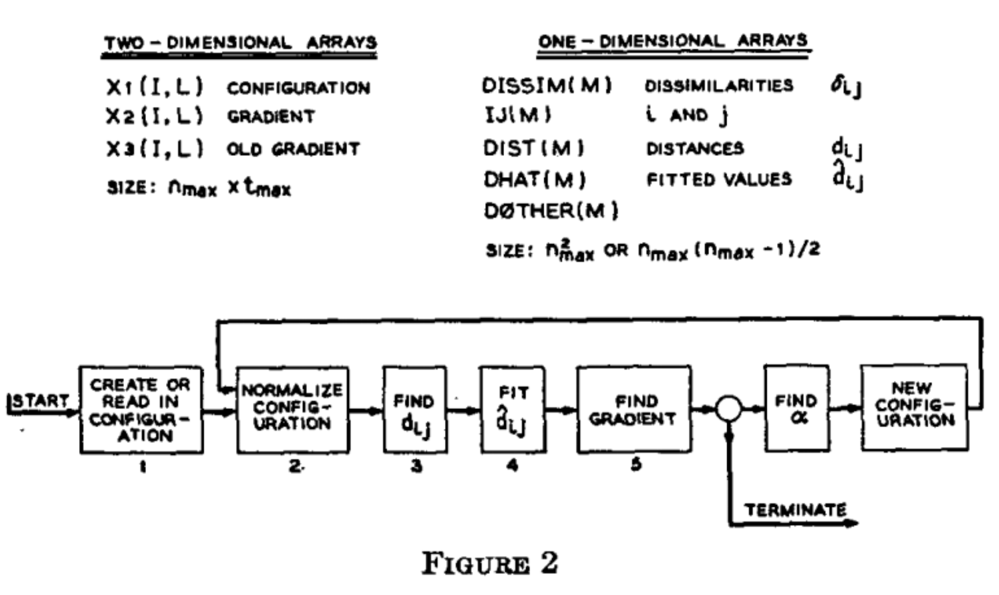
From Kruskal, 1964

Idea is to follow these steps, 

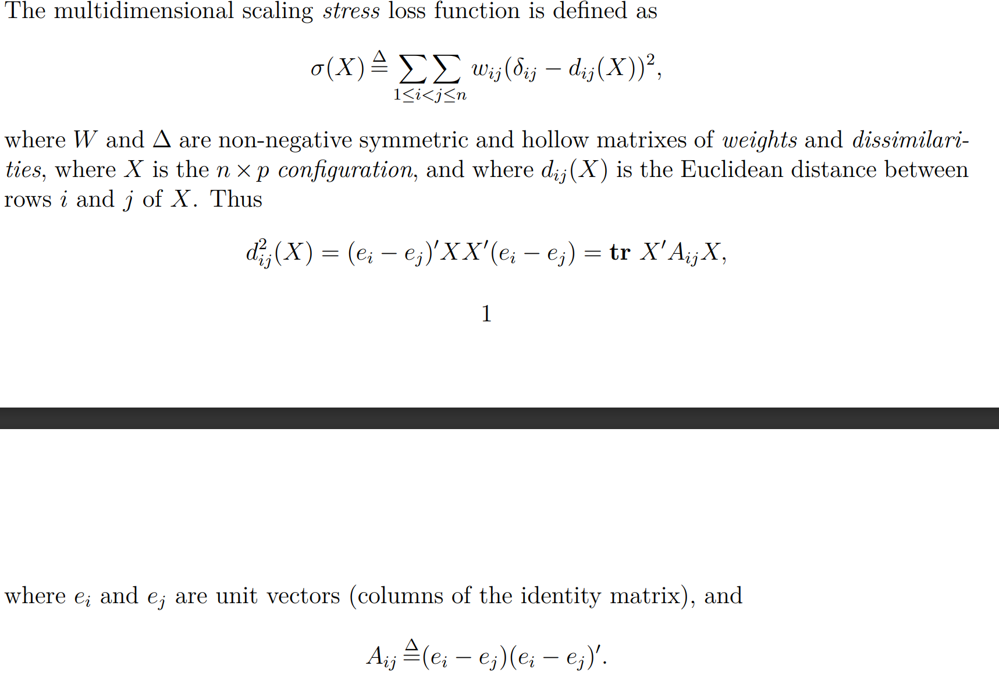
From https://jansweb.netlify.app/publication/deleeuw-e-18-c/
NB: $\delta_{ij}$ here is the true dissimilarity between $i$ and $j$ 

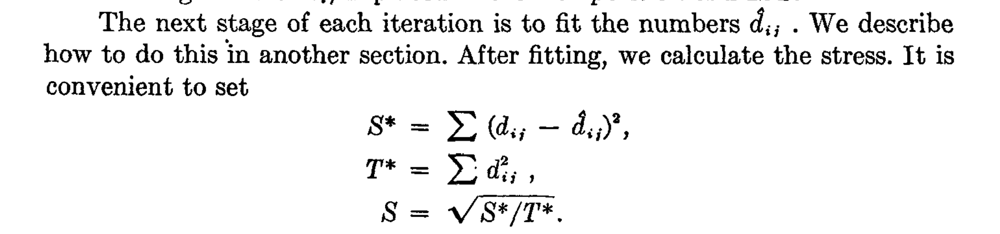
Stress Loss function from Kruskal, 1964

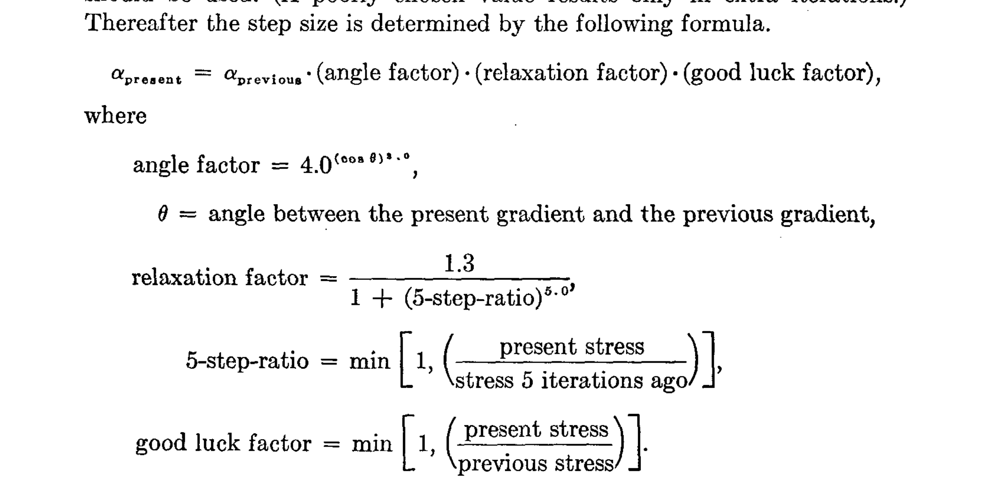
Optimizer from Kruskal, 1964

In [36]:
## Steps 
### Define configuration 
#### for each training iteration
#### normalize 
#### find pairwise distances
#### monotone regression
#### gradient descent



/usr/local/lib/python3.8/dist-packages/numpy/core/numeric.py:2443: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  a1, a2 = asarray(a1), asarray(a2)


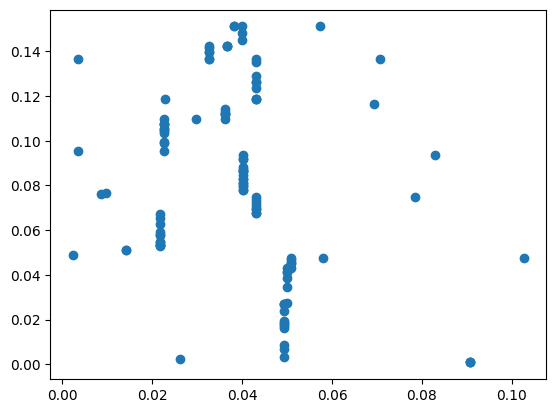

2022-08-26 05:30:21.524 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:21.525 | INFO     | src.autograd_mds:apply_mean:166 - [0.09066934427922775, 0.09066934427922775, 0.09066934427922775, 0.026094871941105862, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04924630417851578, 0.04994254729285494, 0.04994254729285494, 0.04994254729285494, 0.04994254729285494, 0.04994254729285494, 0.04994254729285494, 0.05080139251999034, 0.05080139251999034, 0.05080139251999034, 0.05080139251999034, 0.05080139251999034, 0.10270100871828242, 0.05798330706640298, 0.002354632424854574, 0.01421846421431865, 0.01421846421431865, 0.021814606185283473, 0.021814606185283473, 0.021814606185283473, 0.021814606185283473, 0.021814606185283473, 0.021814606185283473, 0.021814606185283473, 0.0218146061852

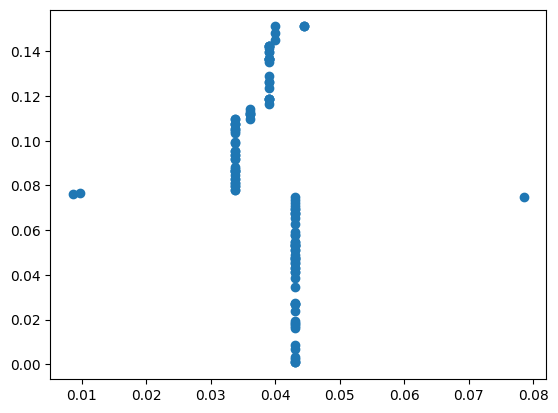

2022-08-26 05:30:21.898 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:21.899 | INFO     | src.autograd_mds:apply_mean:166 - [0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.04309027163953724, 0.0

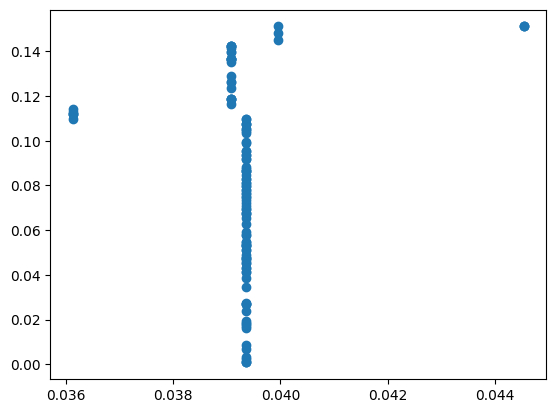

2022-08-26 05:30:22.060 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:22.062 | INFO     | src.autograd_mds:apply_mean:166 - [0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.03935741917926957, 0.0

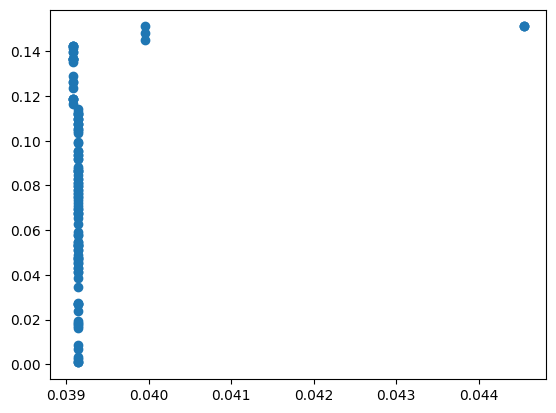

2022-08-26 05:30:22.245 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:22.247 | INFO     | src.autograd_mds:apply_mean:166 - [0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.03914688400502605, 0.0

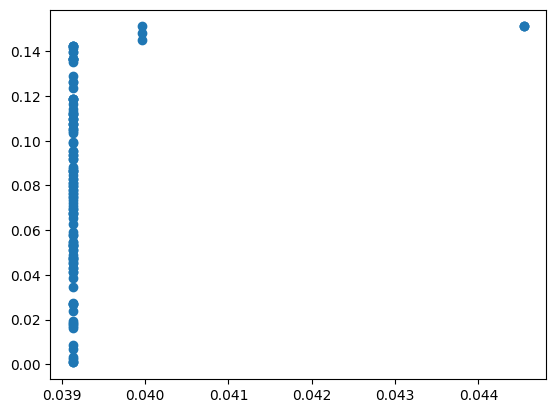

2022-08-26 05:30:22.403 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:22.404 | INFO     | src.autograd_mds:apply_mean:166 - [0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.03913511024936277, 0.0

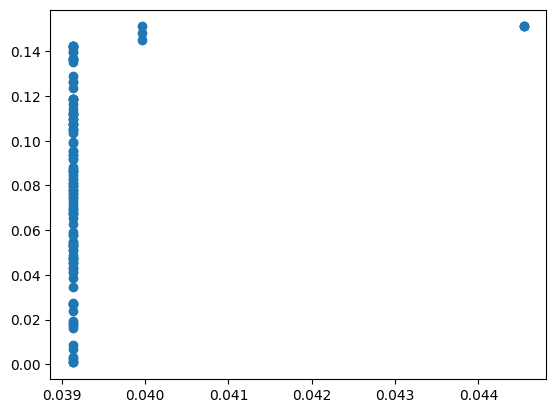

2022-08-26 05:30:22.599 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0008236551773828787, 0.0, 0.0, 0.004587290926561766, 0.0, 0.0]


Sstar: 0.4155036404945005
Tstar: 1.0
stress: 0.6445957186442526
Sstar: Autograd ArrayBox with value 0.5950480416506966
Tstar: 1.0


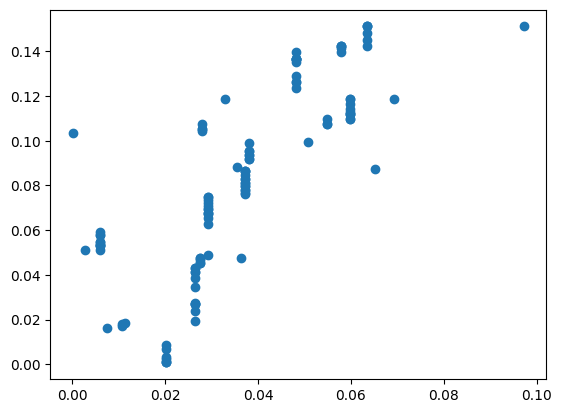

2022-08-26 05:30:22.981 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:22.982 | INFO     | src.autograd_mds:apply_mean:166 - [0.02013579530907578, 0.02013579530907578, 0.02013579530907578, 0.02013579530907578, 0.02013579530907578, 0.02013579530907578, 0.02013579530907578, 0.007405305673671494, 0.010800670378234022, 0.010800670378234022, 0.011290395183021313, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.026423435006750807, 0.02752124799937296, 0.02752124799937296, 0.02752124799937296, 0.02752124799937296, 0.02752124799937296, 0.03629368092222882, 0.02916214105185174, 0.00275505557740592, 0.005988224887558973, 0.005988224887558973, 0.005988224887558973, 0.005988224887558973, 0.005988224887558973, 0.005988224887558973, 0.005988224887558973, 0.005988224887558973, 

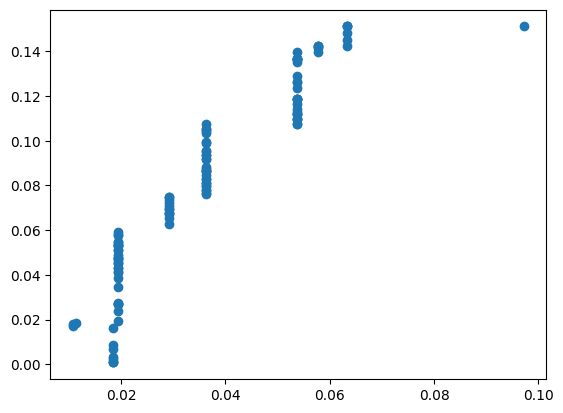

2022-08-26 05:30:23.152 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:23.153 | INFO     | src.autograd_mds:apply_mean:166 - [0.018544484104650247, 0.018544484104650247, 0.018544484104650247, 0.018544484104650247, 0.018544484104650247, 0.018544484104650247, 0.018544484104650247, 0.018544484104650247, 0.010800670378234022, 0.010800670378234022, 0.011290395183021313, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955

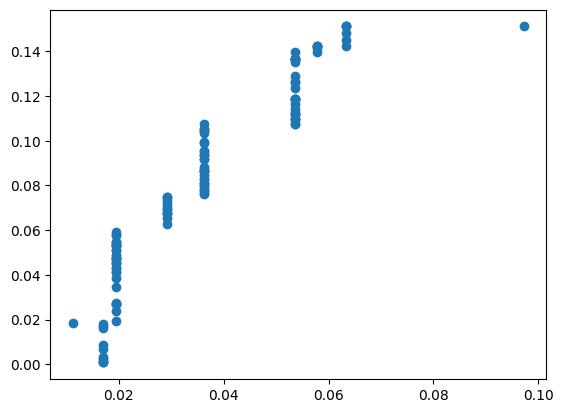

2022-08-26 05:30:23.302 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:23.303 | INFO     | src.autograd_mds:apply_mean:166 - [0.016995721359367, 0.016995721359367, 0.016995721359367, 0.016995721359367, 0.016995721359367, 0.016995721359367, 0.016995721359367, 0.016995721359367, 0.016995721359367, 0.016995721359367, 0.011290395183021313, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0

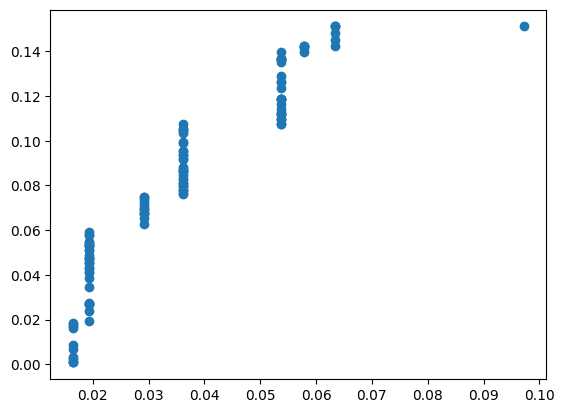

2022-08-26 05:30:23.463 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:23.464 | INFO     | src.autograd_mds:apply_mean:166 - [0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.016477055343335573, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955016502, 0.01942601955

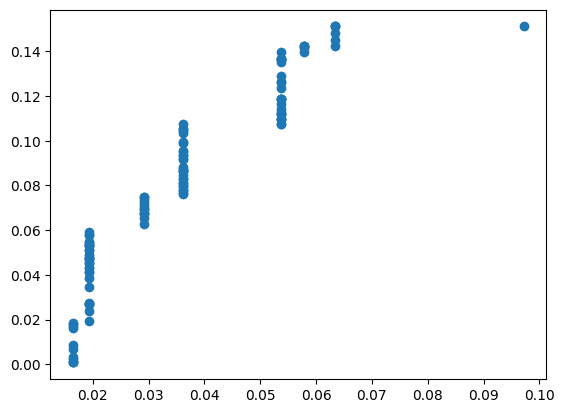

2022-08-26 05:30:23.621 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0029489642068294478, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.009787457645882632, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0070256298146580895, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.01740560737571805, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.004123376123385411, 0.0, 0.0, 0.0, 0.0, 0.0056042190555502525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03386533872365616]


Sstar: 0.3327461320465634
Tstar: 1.0
stress: 0.5768415138030232
Sstar: Autograd ArrayBox with value 0.44474699820333174
Tstar: 1.0


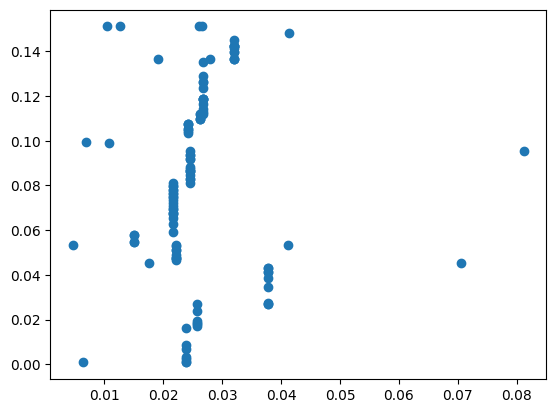

2022-08-26 05:30:23.955 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:23.956 | INFO     | src.autograd_mds:apply_mean:166 - [0.006308888462544437, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.02574619780531916, 0.02574619780531916, 0.02574619780531916, 0.02574619780531916, 0.02574619780531916, 0.02574619780531916, 0.037780383068277766, 0.037780383068277766, 0.037780383068277766, 0.037780383068277766, 0.037780383068277766, 0.037780383068277766, 0.037780383068277766, 0.037780383068277766, 0.037780383068277766, 0.07053447175667785, 0.01759828039807848, 0.02206620945080124, 0.02206620945080124, 0.02206620945080124, 0.02206620945080124, 0.02206620945080124, 0.02206620945080124, 0.02206620945080124, 0.02206620945080124, 0.02206620945080124, 0.041108908331891604, 0.004668395996180891, 0.015062085718258709, 0.015062085718258709, 0.015062085718258709, 0.

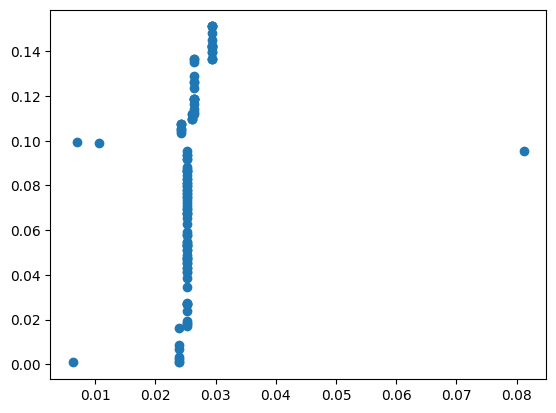

2022-08-26 05:30:24.168 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:24.169 | INFO     | src.autograd_mds:apply_mean:166 - [0.006308888462544437, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163

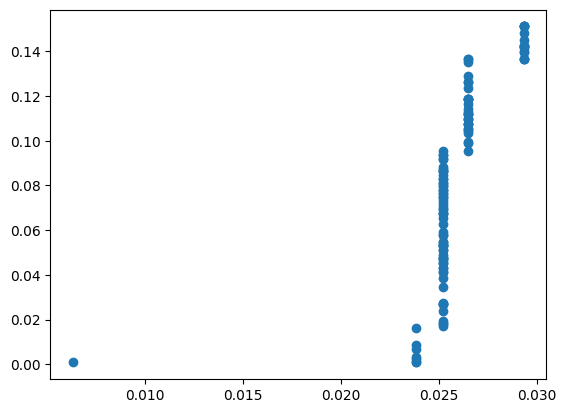

2022-08-26 05:30:24.358 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:24.359 | INFO     | src.autograd_mds:apply_mean:166 - [0.006308888462544437, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.023849351442066766, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163862, 0.02519928841163

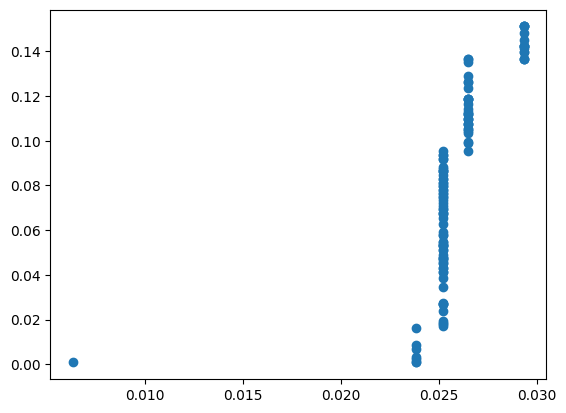

2022-08-26 05:30:24.573 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.01754046297952233, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0013499369695718529, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0012767667313145423, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0028745597570215935, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


Sstar: 0.5609725889246607
Tstar: 1.0
stress: 0.7489810337549682
Sstar: Autograd ArrayBox with value 0.6367697774138446
Tstar: 1.0


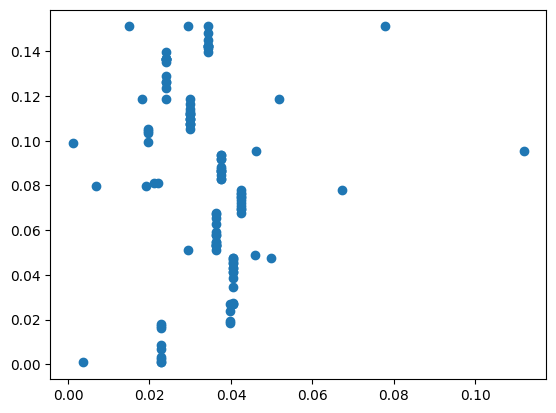

2022-08-26 05:30:24.991 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:24.992 | INFO     | src.autograd_mds:apply_mean:166 - [0.0037928676354515266, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.039686474399103014, 0.039686474399103014, 0.039686474399103014, 0.039686474399103014, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.040426096870163304, 0.049866738784504164, 0.04598522664596329, 0.029363136673700187, 0.03640440557655173, 0.03640440557655173, 0.03640440557655173, 0.03640440557655173, 0.03640440557655173, 0.03640440557655173, 0.03640440557655173, 0.036404405576

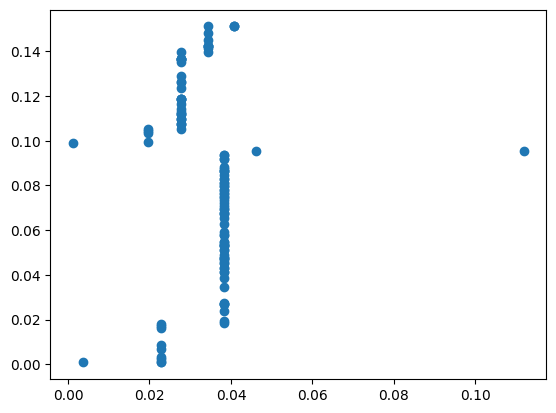

2022-08-26 05:30:25.159 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:25.161 | INFO     | src.autograd_mds:apply_mean:166 - [0.0037928676354515266, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.038302737186620923, 0.0383

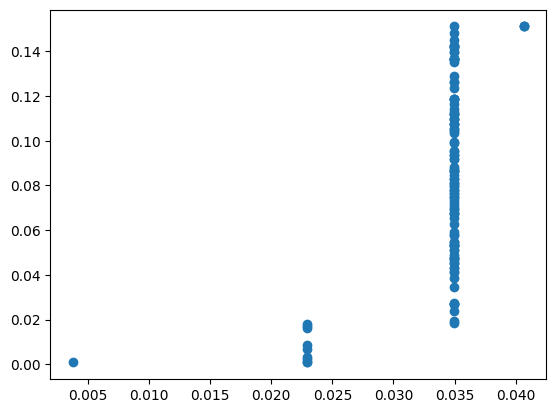

2022-08-26 05:30:25.359 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:25.360 | INFO     | src.autograd_mds:apply_mean:166 - [0.0037928676354515266, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.022940405597835483, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.034927930865214715, 0.0349

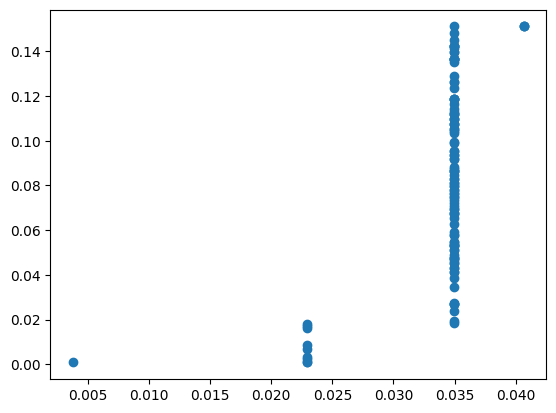

2022-08-26 05:30:25.508 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.019147537962383956, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.011987525267379232, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.005742173802281252, 0.0, 0.0]


Sstar: 0.4548535376924393
Tstar: 1.0
stress: 0.6744283043381553
Sstar: Autograd ArrayBox with value 0.5776886640792693
Tstar: 1.0


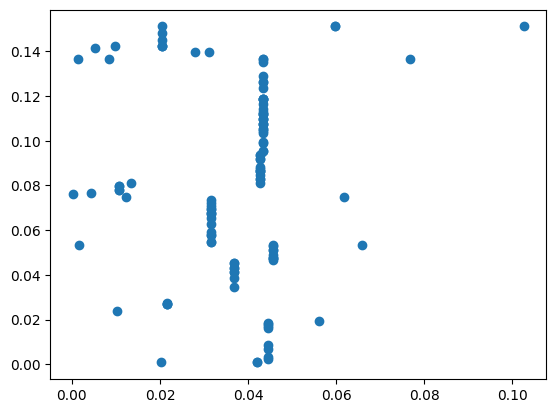

2022-08-26 05:30:25.922 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:25.923 | INFO     | src.autograd_mds:apply_mean:166 - [0.020210673784935157, 0.042021981582366016, 0.042021981582366016, 0.04443432105383501, 0.04443432105383501, 0.04443432105383501, 0.04443432105383501, 0.04443432105383501, 0.04443432105383501, 0.04443432105383501, 0.04443432105383501, 0.05619449290038932, 0.010253767385694074, 0.021623427011719744, 0.021623427011719744, 0.021623427011719744, 0.021623427011719744, 0.036833092623367564, 0.036833092623367564, 0.036833092623367564, 0.036833092623367564, 0.036833092623367564, 0.036833092623367564, 0.036833092623367564, 0.036833092623367564, 0.04563187214930267, 0.04563187214930267, 0.04563187214930267, 0.04563187214930267, 0.04563187214930267, 0.04563187214930267, 0.04563187214930267, 0.04563187214930267, 0.04563187214930267, 0.06580492118056579, 0.0015959655885830802, 0.03153384502084234, 0.03153384502084234, 0.03153384502084234, 0.0315

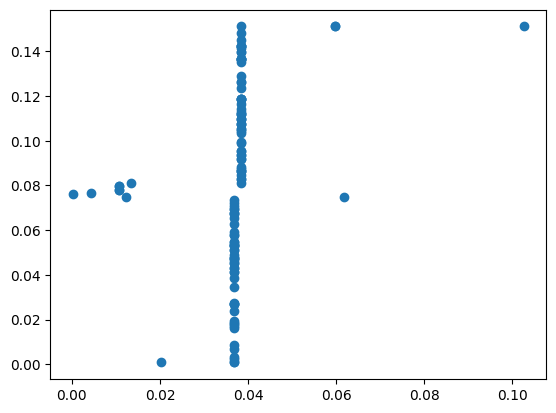

2022-08-26 05:30:26.125 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:26.126 | INFO     | src.autograd_mds:apply_mean:166 - [0.020210673784935157, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.03676441304681646, 0.

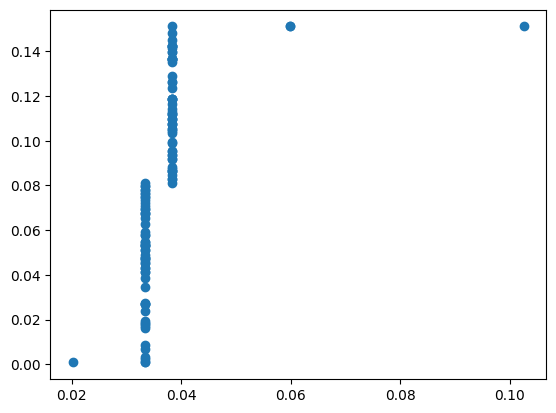

2022-08-26 05:30:26.275 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:26.276 | INFO     | src.autograd_mds:apply_mean:166 - [0.020210673784935157, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.03343947261420594, 0.

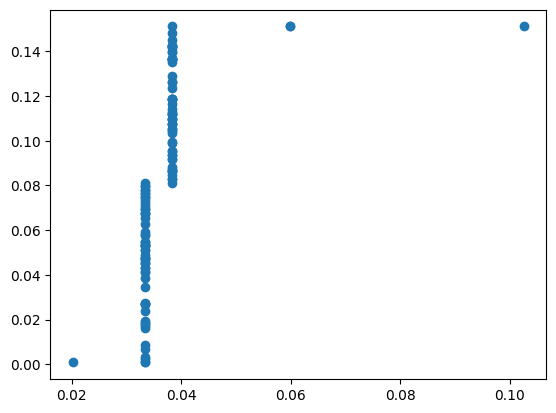

2022-08-26 05:30:26.416 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.013228798829270784, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.004871704593503383, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02150510263859351, 0.0, 0.0428100287937791]


Sstar: 0.41451217785611594
Tstar: 1.0
stress: 0.6438262015917929
Sstar: Autograd ArrayBox with value 0.5422214275385516
Tstar: 1.0


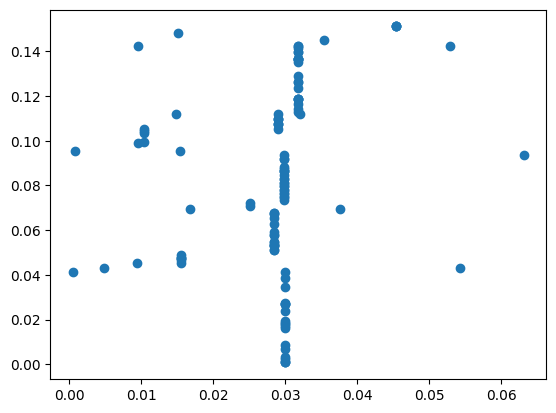

2022-08-26 05:30:26.866 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:26.867 | INFO     | src.autograd_mds:apply_mean:166 - [0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.03001396958190492, 0.0005515808663553376, 0.05432253357360924, 0.004900620503528658, 0.009449486104357321, 0.015612473420686777, 0.015612473420686777, 0.015612473420686777, 0.015612473420686777, 0.015612473420686777, 0.015612473420686777, 0.028504188218726093, 0.028504188218726093, 0.028504188218726093, 0.028504188218726093, 0.028504188218726093, 0.028504188218726093, 0.028504188218726093, 0.028504188218726093, 0.028504188218726093, 0.028

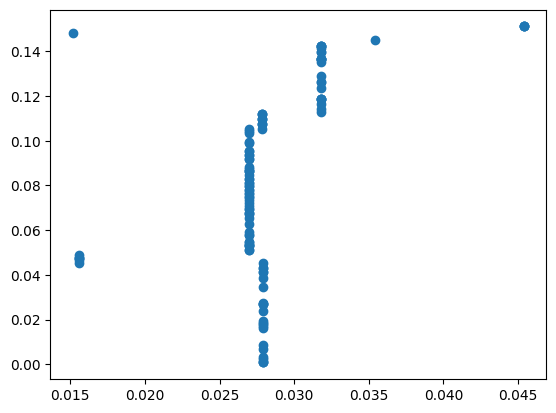

2022-08-26 05:30:27.029 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:27.030 | INFO     | src.autograd_mds:apply_mean:166 - [0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.027895983861914535, 0.015612473420686777, 0.015612473420686777, 0.015612473420686777, 0.015612473420686777, 0.015612473420686777, 0.015612473420686777, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.0269576627084

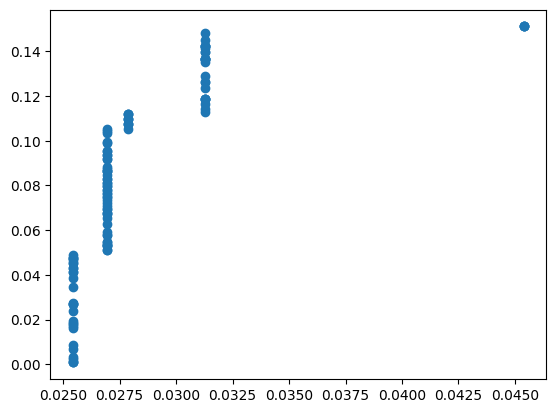

2022-08-26 05:30:27.202 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:27.204 | INFO     | src.autograd_mds:apply_mean:166 - [0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02543928177366898, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.02695766270841466, 0.0

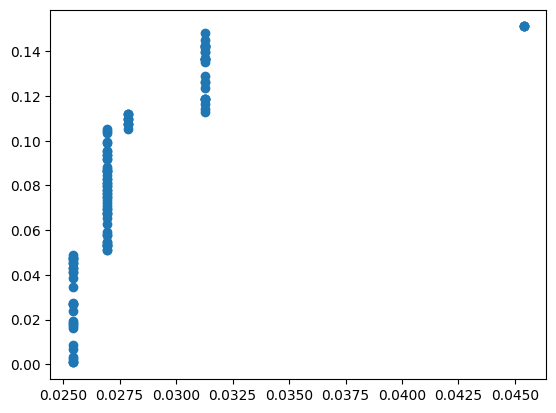

2022-08-26 05:30:27.360 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00151838093474568, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0009152986957714354, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0034268847105911535, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.014096190159969768, 0.0, 0.0, 0.0]


Sstar: 0.5192678726721947
Tstar: 1.0
stress: 0.720602437320465
Sstar: Autograd ArrayBox with value 0.5921185313668406
Tstar: 1.0


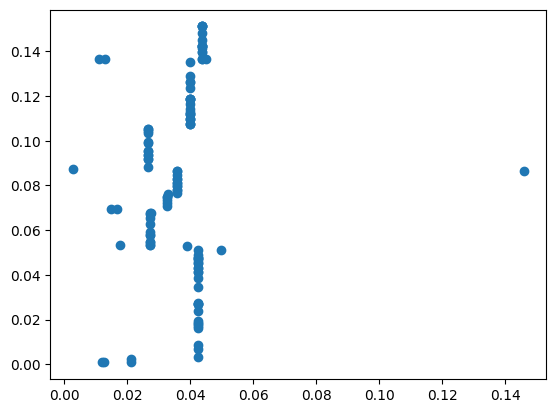

2022-08-26 05:30:27.949 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:27.950 | INFO     | src.autograd_mds:apply_mean:166 - [0.012096540831072145, 0.012634530569258916, 0.021066530932602925, 0.021066530932602925, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.042334681706301315, 0.04990969225325919, 0.03883413945571702, 0.0178392768843064, 0.027122169977056684, 0.027122169977056684, 0.027122169977056684, 0.027122169977056684, 0.027122169

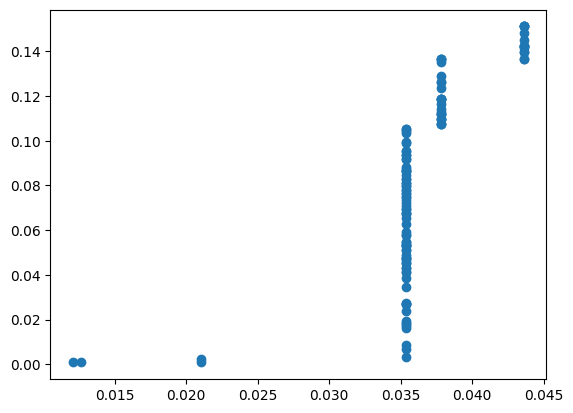

2022-08-26 05:30:28.120 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:28.121 | INFO     | src.autograd_mds:apply_mean:166 - [0.012096540831072145, 0.012634530569258916, 0.021066530932602925, 0.021066530932602925, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628, 0.03539948968160628,

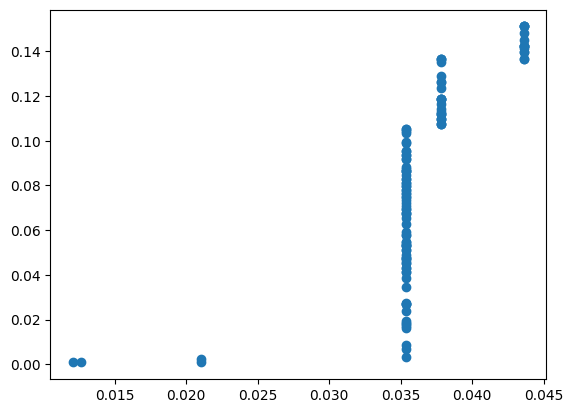

2022-08-26 05:30:28.272 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.0005379897381867713, 0.00843200036334401, 0.0, 0.014332958749003352, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0024397058894859783, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.005780130886962706, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


Sstar: 0.42006356091889224
Tstar: 1.0
stress: 0.6481231062991755
Sstar: Autograd ArrayBox with value 0.5627834406713232
Tstar: 1.0


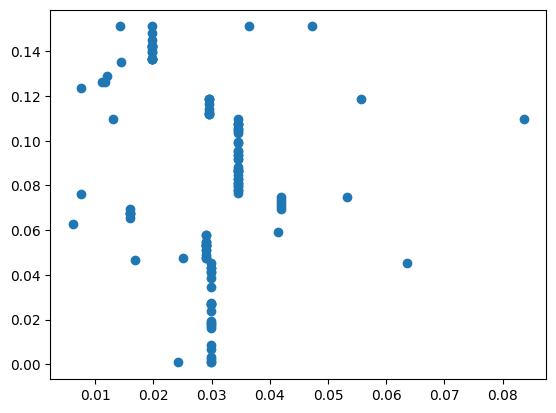

2022-08-26 05:30:28.658 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:28.659 | INFO     | src.autograd_mds:apply_mean:166 - [0.024228411710464987, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.02997481566882501, 0.0635800228448706, 0.01689622905065608, 0.025057790990762843, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168057219312, 0.028965168

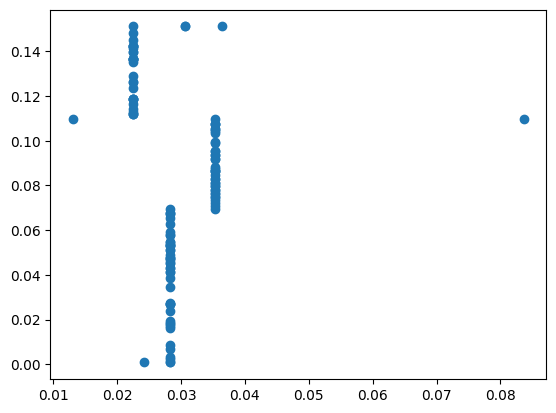

2022-08-26 05:30:28.884 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:28.885 | INFO     | src.autograd_mds:apply_mean:166 - [0.024228411710464987, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.02823

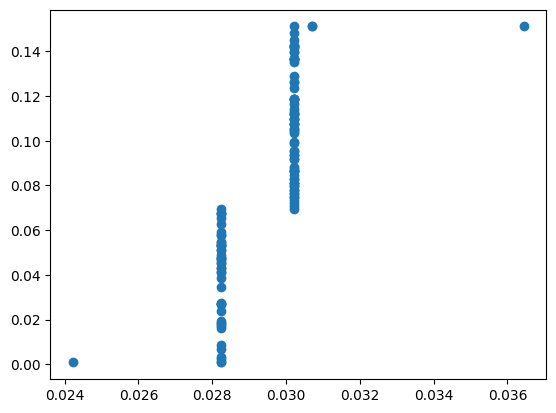

2022-08-26 05:30:29.082 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:29.084 | INFO     | src.autograd_mds:apply_mean:166 - [0.024228411710464987, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.028232236836768308, 0.02823

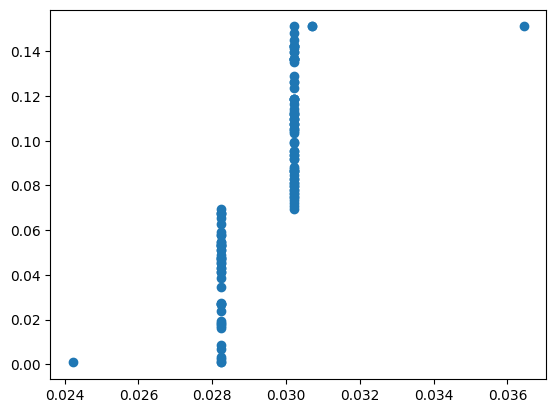

2022-08-26 05:30:29.267 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.004003825126303321, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.001986015285884296, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.000489469626646713, 0.0, 0.005740303826128668]


Sstar: 0.5193526996063381
Tstar: 1.0
stress: 0.7206612932621941
Sstar: Autograd ArrayBox with value 0.6306457701544179
Tstar: 1.0


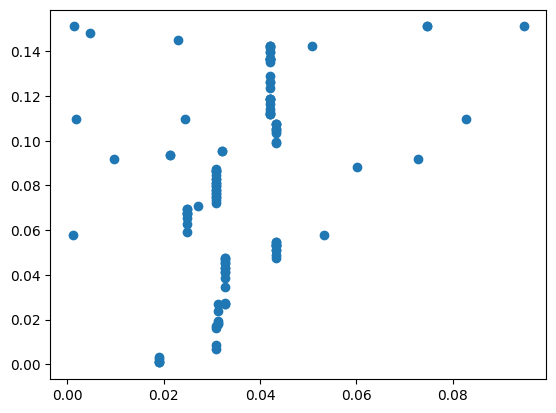

2022-08-26 05:30:29.626 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:29.627 | INFO     | src.autograd_mds:apply_mean:166 - [0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.03077154361707555, 0.03077154361707555, 0.03077154361707555, 0.03077154361707555, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.03281450478159485, 0.0432607842358152, 0.0432607842358152, 0.0432607842358152, 0.0432607842358152, 0.0432607842358152, 0.0432607842358152, 0.0432607842358152, 0.0432607842358152, 0.0432607842358152, 0.0432607842358152, 0.05334759758689263, 0.001165467902204147, 0.02488

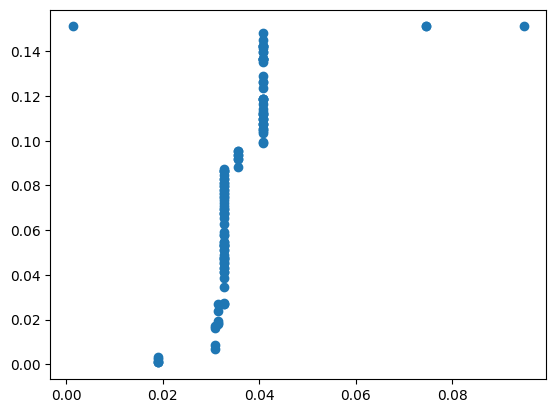

2022-08-26 05:30:29.820 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:29.821 | INFO     | src.autograd_mds:apply_mean:166 - [0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.03077154361707555, 0.03077154361707555, 0.03077154361707555, 0.03077154361707555, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.03258311617626

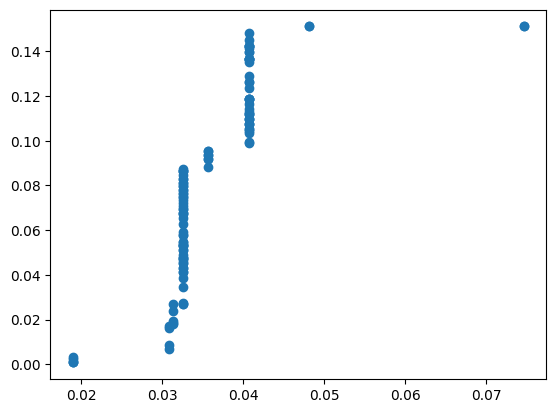

2022-08-26 05:30:29.994 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:29.996 | INFO     | src.autograd_mds:apply_mean:166 - [0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.01898784583038391, 0.03077154361707555, 0.03077154361707555, 0.03077154361707555, 0.03077154361707555, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.031362702771785066, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.032583116176263076, 0.03258311617626

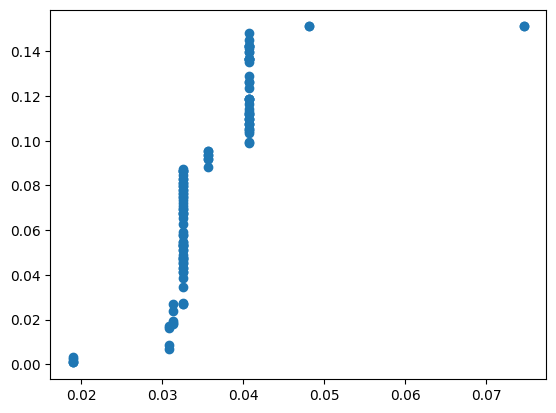

2022-08-26 05:30:30.138 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.0, 0.0, 0.0, 0.0, 0.011783697786691638, 0.0, 0.0, 0.0, 0.0005911591547095169, 0.0, 0.0, 0.0, 0.0, 0.0012204134044780102, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.003064242595420763, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.005074283933065152, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.007384439274844043, 0.0, 0.026515406628289113, 0.0]


Sstar: 0.4042651929519785
Tstar: 1.0
stress: 0.6358185220265122
Sstar: Autograd ArrayBox with value 0.5110025347714099
Tstar: 1.0


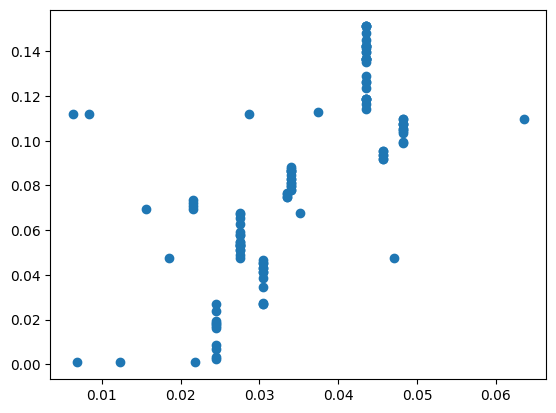

2022-08-26 05:30:30.577 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:30.578 | INFO     | src.autograd_mds:apply_mean:166 - [0.006917523520899043, 0.012288574291634978, 0.021879295824196402, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.03047181211615907, 0.0470365015578219, 0.018521346665404656, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297869270775, 0.02752297

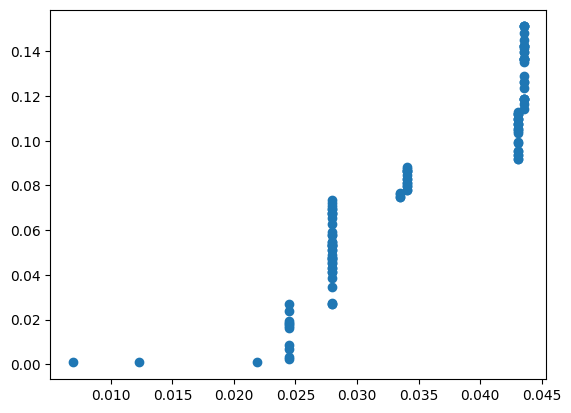

2022-08-26 05:30:30.790 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:30.791 | INFO     | src.autograd_mds:apply_mean:166 - [0.006917523520899043, 0.012288574291634978, 0.021879295824196402, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.024487244412623888, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.028003416650656386, 0.02800

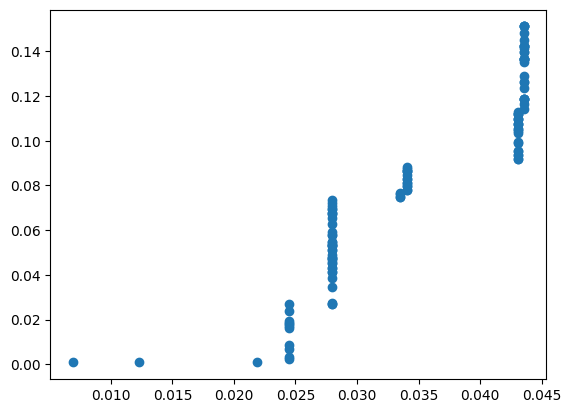

2022-08-26 05:30:30.945 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.005371050770735936, 0.009590721532561424, 0.002607948588427486, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.003516172238032498, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0055049604188755485, 0.0, 0.0, 0.0, 0.0005546961232106642, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.009053872229787915, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0004492492592699168, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


Sstar: 0.3991402877811178
Tstar: 1.0
stress: 0.6317755042585284
Sstar: Autograd ArrayBox with value 0.5087042793706246
Tstar: 1.0


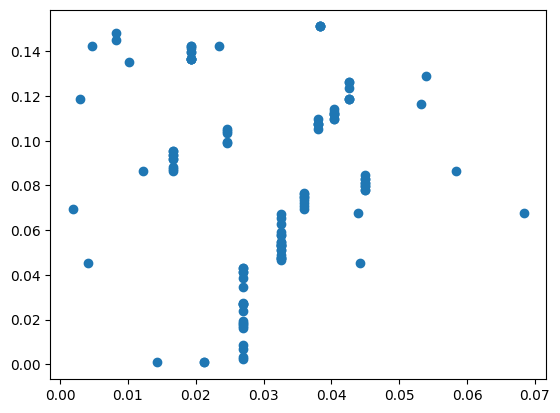

2022-08-26 05:30:31.275 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:31.277 | INFO     | src.autograd_mds:apply_mean:166 - [0.021180050331106114, 0.021180050331106114, 0.01431382052103882, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.026926662346837254, 0.044173614607294645, 0.004165797588717898, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 0.03250918167177485, 

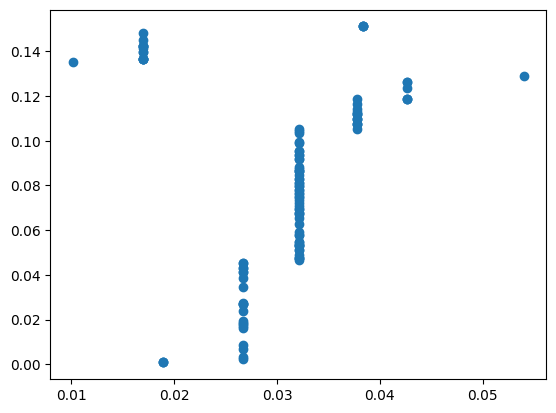

2022-08-26 05:30:31.462 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:31.463 | INFO     | src.autograd_mds:apply_mean:166 - [0.01889130706108368, 0.01889130706108368, 0.01889130706108368, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.0321033952956325, 0.03210339529563

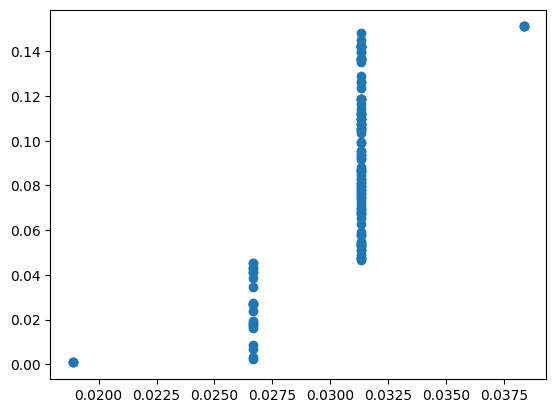

2022-08-26 05:30:31.653 | INFO     | src.autograd_mds:apply_mean:165 - PRED_DIS_OUT:
2022-08-26 05:30:31.655 | INFO     | src.autograd_mds:apply_mean:166 - [0.01889130706108368, 0.01889130706108368, 0.01889130706108368, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.026676029960579894, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.03133504831873189, 0.

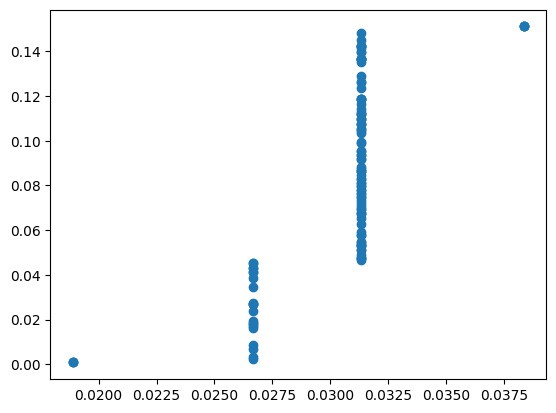

2022-08-26 05:30:31.864 | INFO     | src.autograd_mds:run_monoreg:194 - FIRST DIFFS:
[0.0, 0.0, 0.0077847228994962145, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0046590183581519985, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.007033877429838485, 0.0, 0.0, 0.0]


Sstar: 0.4970257582291112
Tstar: 1.0
stress: 0.7050005377509376
Sstar: Autograd ArrayBox with value 0.6009337079816021
Tstar: 1.0


In [37]:
loop_config = my_mds_training_loop(dissimilarity_vec, n_init=11,eps =1.0)

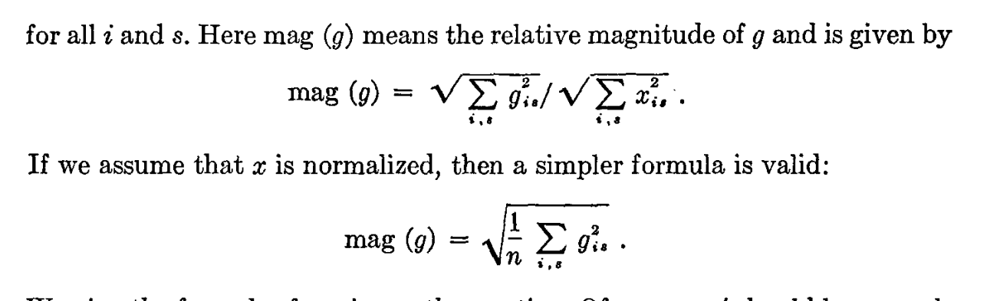

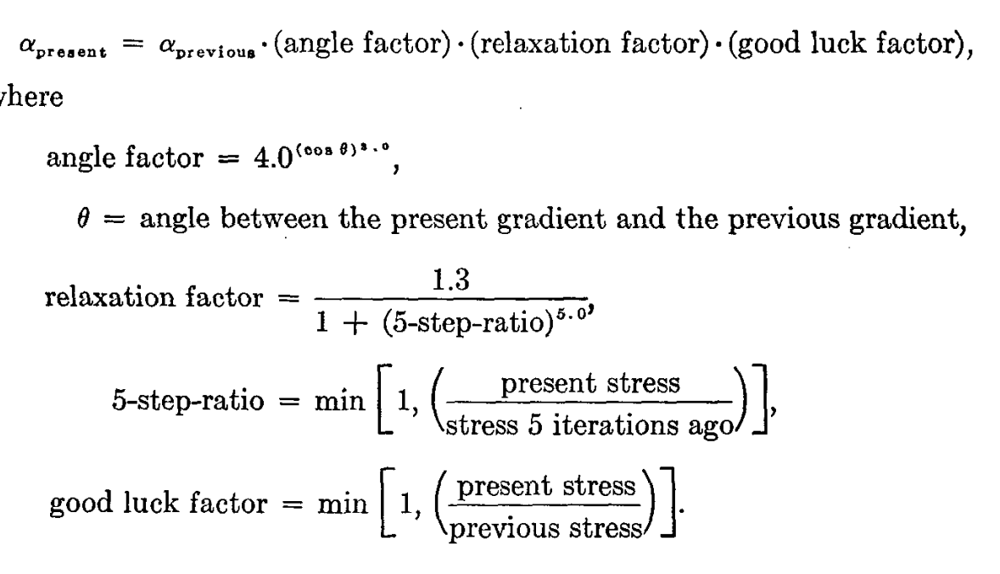

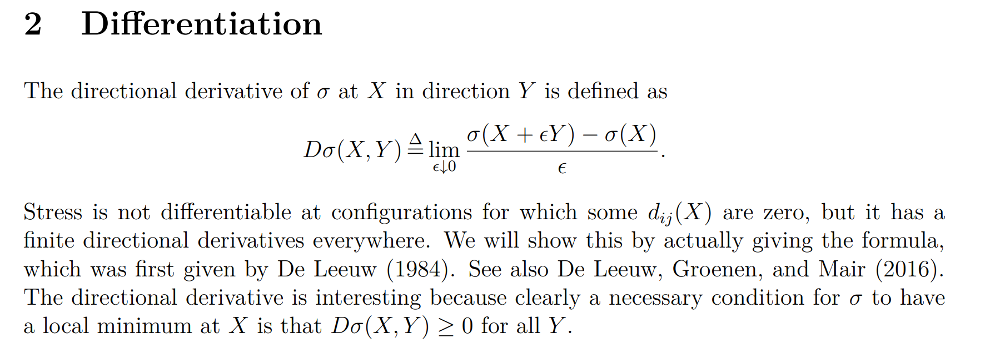
From https://jansweb.netlify.app/publication/deleeuw-e-18-c/

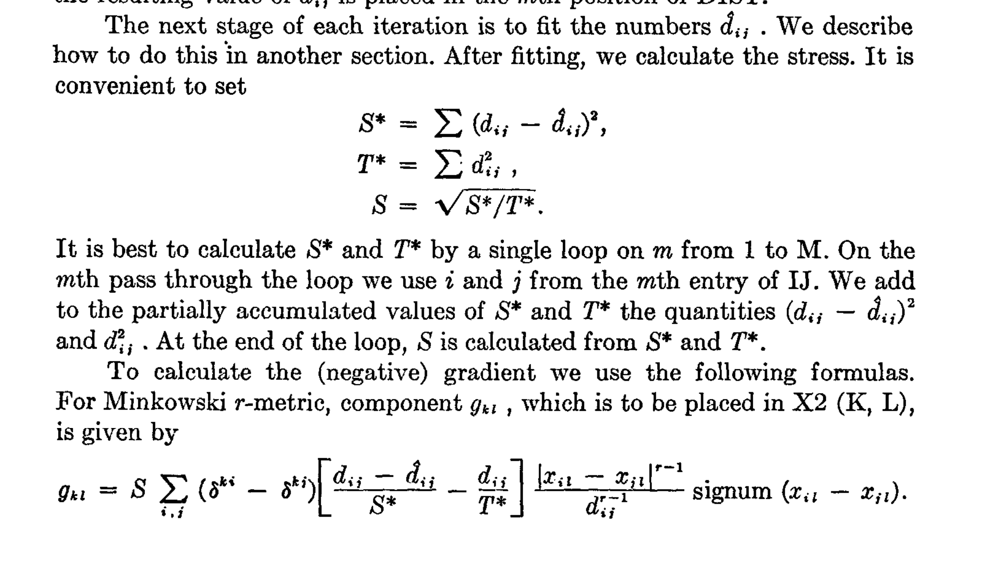
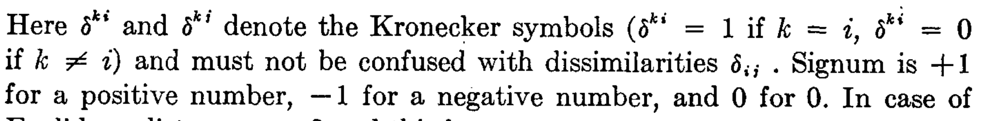
From Kruskal, 1964

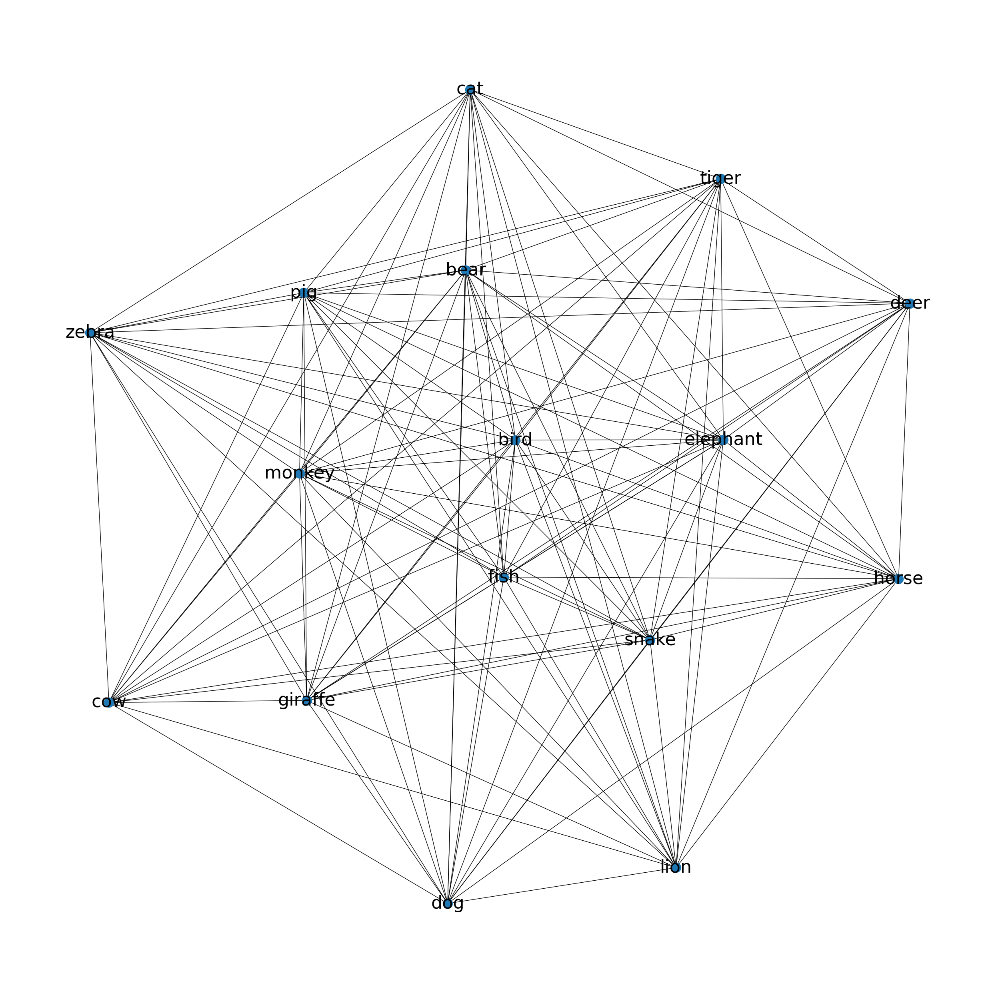

In [38]:
fig, ax = plt.subplots(figsize=(32,32))
nx.draw(animal_pairs.subgraph(big_matrix.index.to_list()), with_labels=True, ax=ax, font_size=32,
       pos=nx.spring_layout(animal_pairs.subgraph(big_matrix.index.to_list())))

plt.show()

In [39]:
refMDS = MDS(dissimilarity="precomputed",metric=False,)

In [40]:
dissimilarity_mat = np.exp(-1*np.nan_to_num(similarities)) - np.eye(similarities.shape[0])

In [41]:
plt.matshow(dissimilarity_mat)

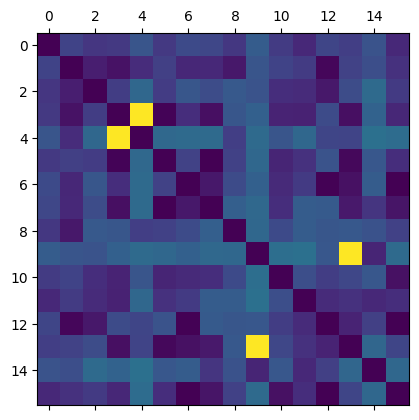

In [42]:
plt.show()

In [43]:
new_config = refMDS.fit_transform(dissimilarity_mat)

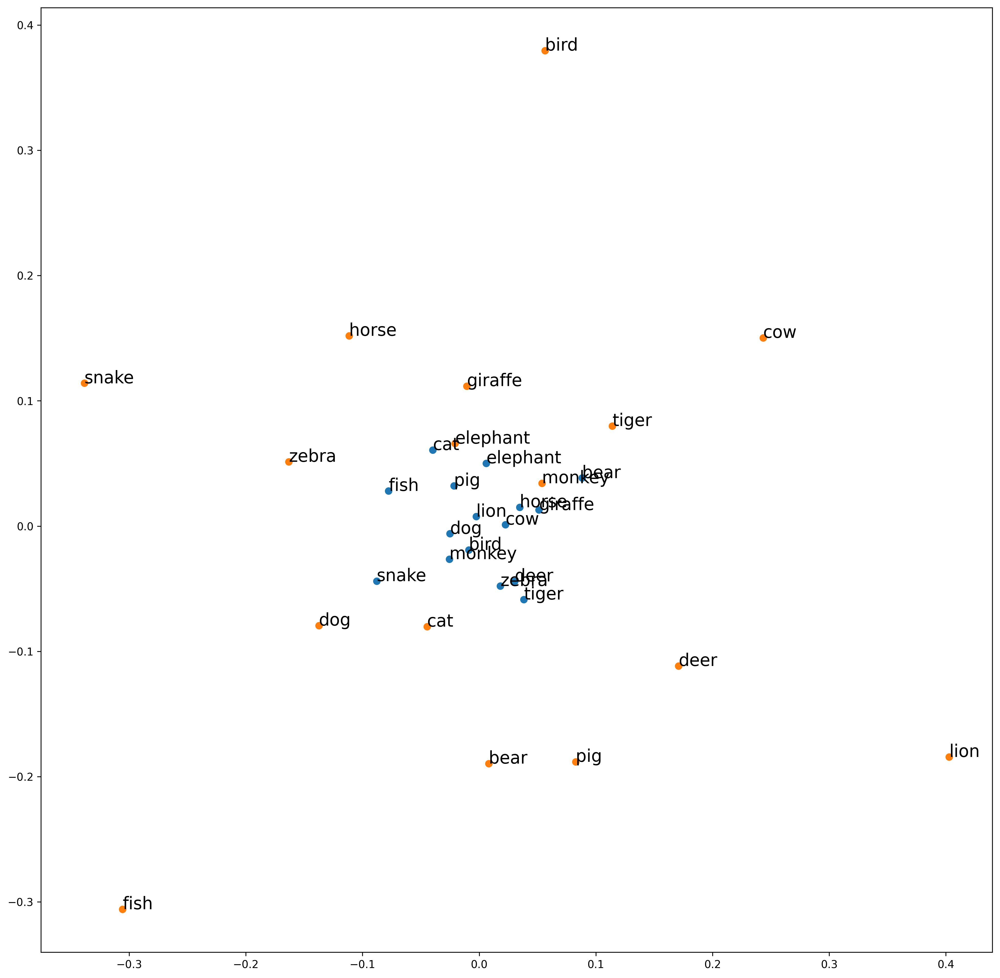

In [44]:
new_config /= np.sqrt((new_config**2).sum())
loop_config /= np.sqrt((loop_config**2).sum())
# Rotate the data
clf = PCA(n_components=2)

new_config = clf.fit_transform(new_config)
loop_config = clf.fit_transform(loop_config)

fig, ax = plt.subplots(figsize=(16,16), dpi=300)
ax.scatter(x=loop_config[:,0], y=loop_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax.annotate(label, (loop_config[i,0], loop_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')

ax.scatter(x=new_config[:,0], y=new_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax.annotate(label, (new_config[i,0], new_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')
plt.show()

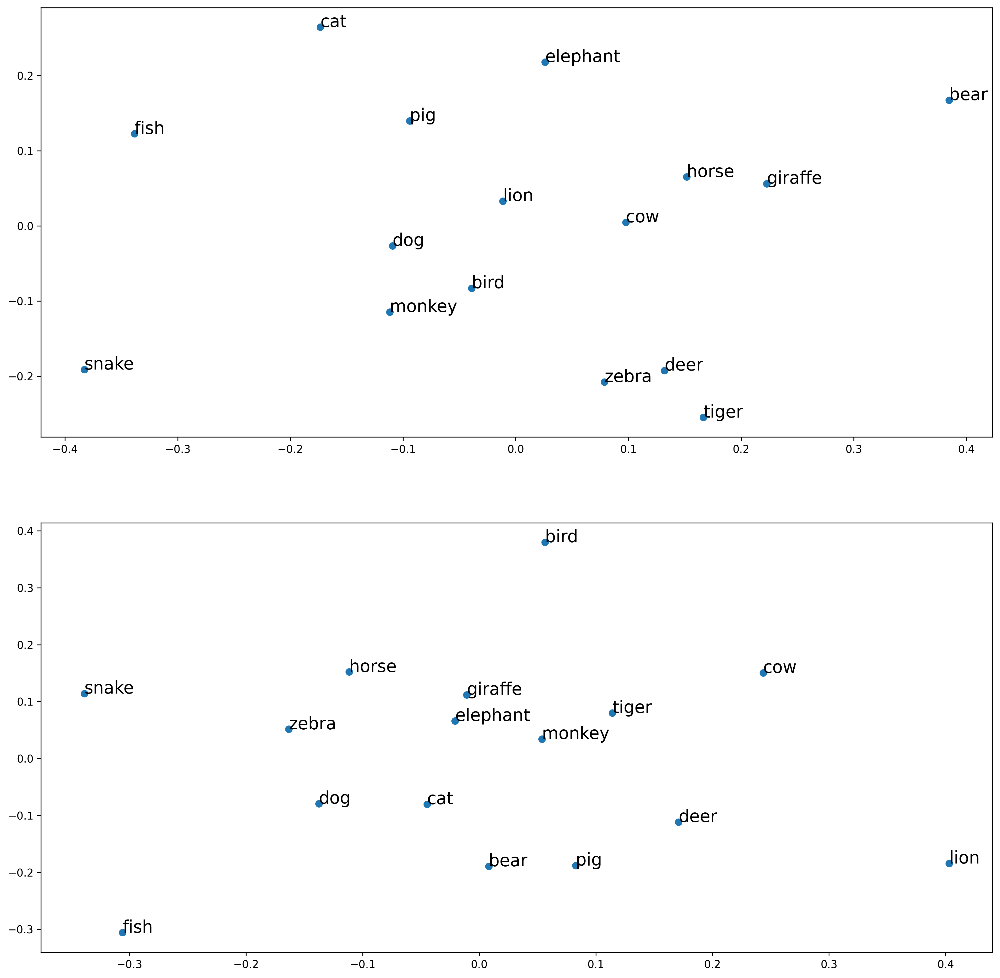

In [45]:
new_config /= np.sqrt((new_config**2).sum())
loop_config /= np.sqrt((loop_config**2).sum())
# Rotate the data
clf = PCA(n_components=2)

new_config = clf.fit_transform(new_config)
loop_config = clf.fit_transform(loop_config)

fig, ax = plt.subplots(2,1,figsize=(16,16), dpi=300)
ax[0].scatter(x=loop_config[:,0], y=loop_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax[0].annotate(label, (loop_config[i,0], loop_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')

ax[1].scatter(x=new_config[:,0], y=new_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax[1].annotate(label, (new_config[i,0], new_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')
plt.show()